# Brent Oil Prices Prediction using Prophet & ARIMA

Dataset is available on U.S. Energy Information Administration: <a href="https://www.eia.gov/dnav/pet/hist_xls/RBRTEd.xls">Europe Brent Spot Price FOB (Dollars per Barrel)</a>

Article explaining the code is available <a href="https://medium.com/analytics-vidhya/brent-oil-prices-forecast-with-prophet-and-arima-50f5f177da5b">here</a>


In [169]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from math import sqrt
import warnings
warnings.filterwarnings('ignore')

In [170]:
#import the excel file
oilPrices = pd.read_excel('RBRTEd.xls', skiprows=2, sheet_name='Data 1')
#change column names to more comfortable names
oilPrices.columns=['date', 'price']

In [171]:
#Check the top five records
oilPrices.head()

,date,price
0,1987-05-20,18.63
1,1987-05-21,18.45
2,1987-05-22,18.55
3,1987-05-25,18.60
4,1987-05-26,18.63


In [172]:
#As you may noticed the time series data does not contain the values for Saturday and Sunday. Hence missing values have to be filled. 
#Fill in Weekends - First make date as index (for resample method), then use forward fill ffill(),
#which will assign the weekend values with Friday value. Resample method for frequency conversion and resampling of time series. Object must have a datetime-like index (DatetimeIndex, PeriodIndex, or TimedeltaIndex), 
#or pass datetime-like values to the on or level keyword
oilPrices.set_index('date', inplace=True)
oilPrices = oilPrices.resample('D').ffill().reset_index()

In [173]:
#Check the top five records
oilPrices.head()

,date,price
0,1987-05-20,18.63
1,1987-05-21,18.45
2,1987-05-22,18.55
3,1987-05-23,18.55
4,1987-05-24,18.55


In [174]:
#Make sure the data types as expected
oilPrices.dtypes

date     datetime64[ns]
price           float64
dtype: object

In [175]:
#Make sure we have no null values
oilPrices.isnull().values.any()

False

In [176]:
#Let us split the date into year, month and week to explore trend in oil prices
oilPrices['year']=oilPrices['date'].dt.year
oilPrices['month']=oilPrices['date'].dt.month
oilPrices['week']=oilPrices['date'].dt.week

In [177]:
#Let us read the data until the 1st of January 2019 to split the data and predict prices in 2019
train = oilPrices[(oilPrices['date' ] > '2000-01-01') & (oilPrices['date' ] <= '2018-12-31')]
test = oilPrices[oilPrices['date' ] >= '2019-01-01']

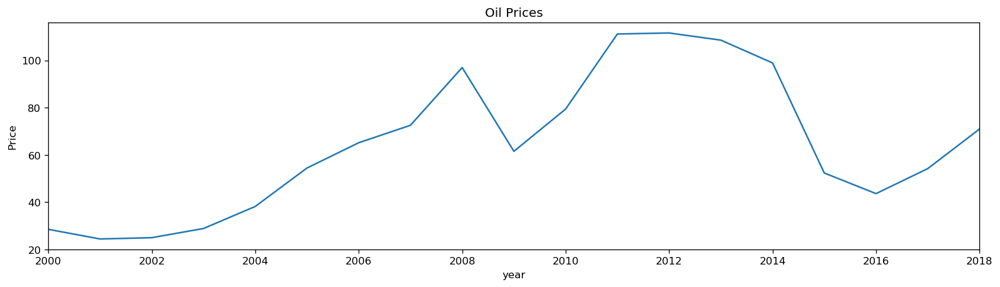

In [178]:
#Yearly price visualization
yearlyPrice=train.groupby(["year"])['price'].mean()
plt.figure(figsize=(16,4))
plt.title('Oil Prices')
plt.xlabel('Year')
plt.ylabel('Price')
yearlyPrice.plot()
plt.show();

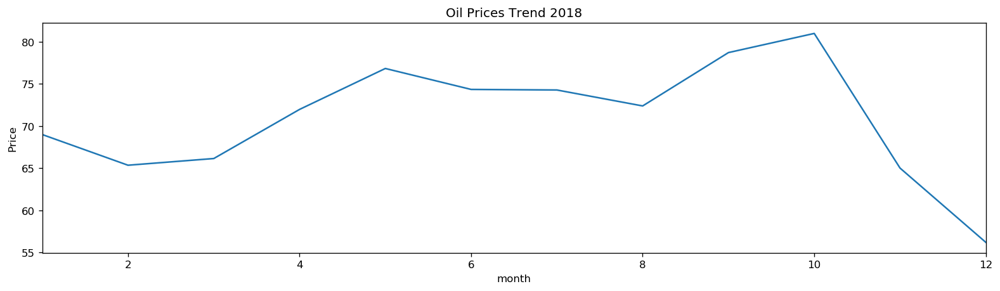

In [179]:
#Monthly price visualization 2018
monthlyPrice=oilPrices[oilPrices['year'] == 2018].groupby(["month"])['price'].mean()
plt.figure(figsize=(16,4))
plt.title('Oil Prices Trend 2018')
plt.xlabel('Month')
plt.ylabel('Price')
monthlyPrice.plot()
plt.show();

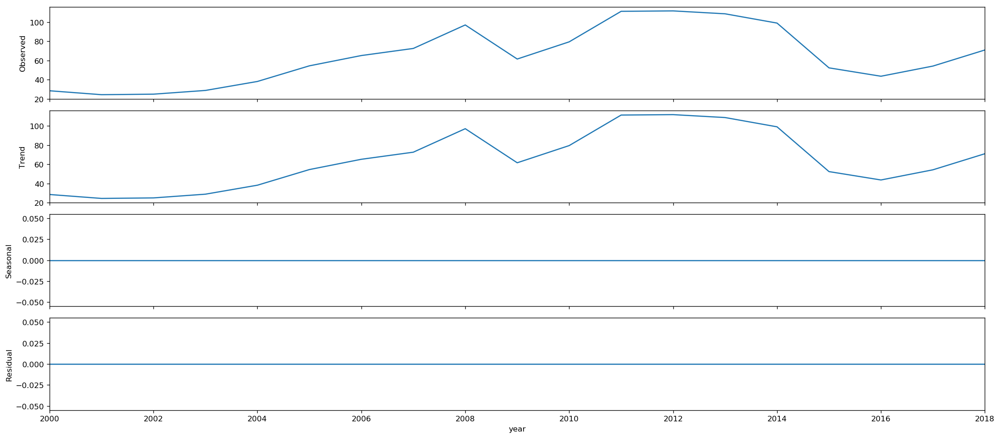

In [180]:
#time-series to decompose our time series into three distinct components: trend, seasonality, and noise.
monthlyPrice=oilPrices.groupby(["month"])['price'].mean()
from pylab import rcParams
rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(yearlyPrice, freq=1, model='additive')
fig = decomposition.plot()
plt.show()

In [181]:
from fbprophet import Prophet
d={'ds':train['date'],'y':train['price']}
df_pred=pd.DataFrame(data=d)
# I took off Seasonality as Oil prices on weekends remain same as Friday until next opening on Monday
model = Prophet(daily_seasonality=False)
model.fit(df_pred)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)

In [182]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
7299,2019-12-27,71.302019,46.175972,99.876191
7300,2019-12-28,71.376654,45.763557,97.306426
7301,2019-12-29,71.453937,47.499805,99.380745
7302,2019-12-30,71.499557,46.319602,96.483124
7303,2019-12-31,71.547769,47.584015,99.255494


<Figure size 2160x720 with 0 Axes>

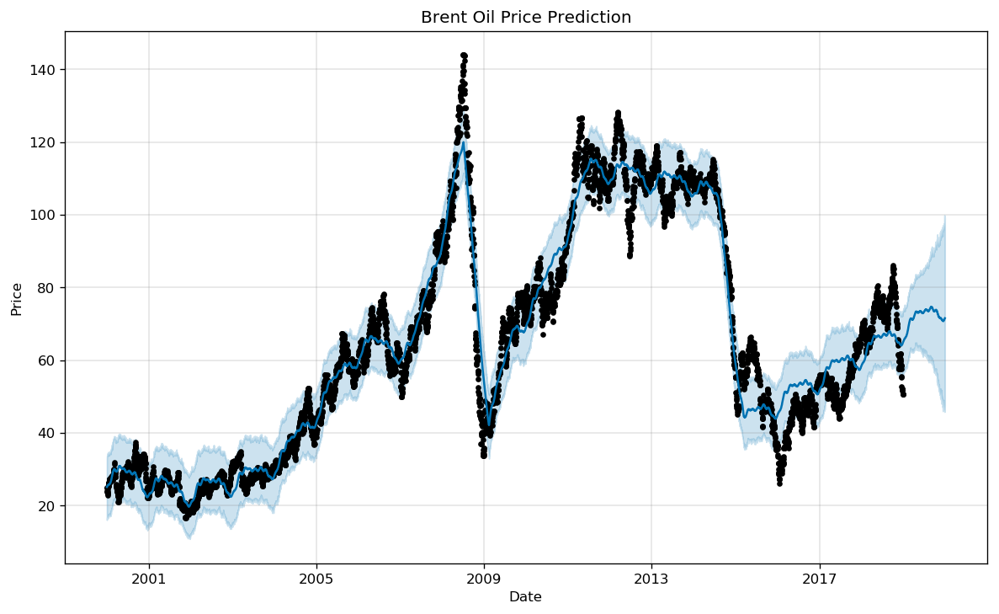

In [183]:
plt.figure(figsize=(18, 6))
model.plot(forecast, xlabel = 'Date', ylabel = 'Price')
plt.title('Brent Oil Price Prediction');

In [184]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model, forecast)  # This returns a plotly Figure
py.iplot(fig)

In [185]:
forecast2019=forecast[(forecast['ds' ] >= '2019-01-01') & (forecast['ds' ] <= '2019-09-30')]

In [186]:
forecast2019[['ds', 'yhat']].head()

,ds,yhat
6939,2019-01-01,64.940630
6940,2019-01-02,65.023265
6941,2019-01-03,65.218723
6942,2019-01-04,65.291265
6943,2019-01-05,65.367389


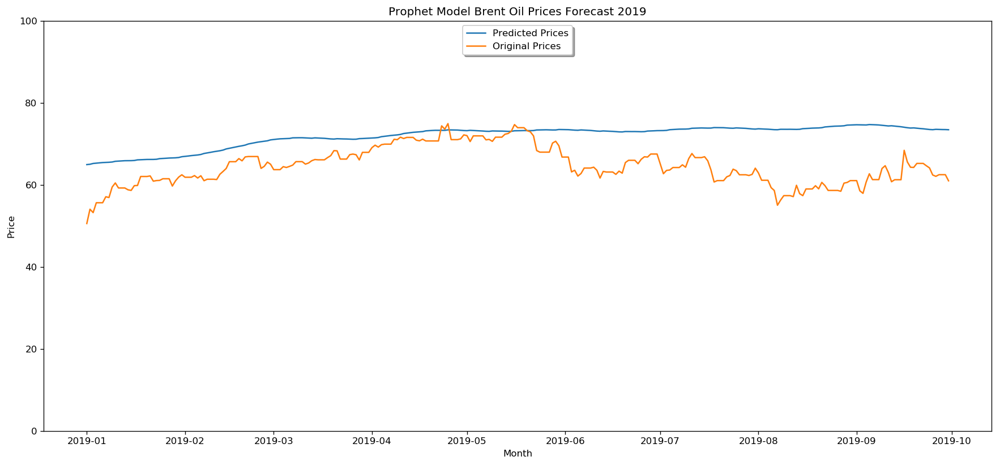

In [187]:
# Create plots with pre-defined labels.
fig, ax = plt.subplots()
ax.plot(forecast2019['ds'], forecast2019['yhat'], label='Predicted Prices')
ax.plot(test['date'], test['price'], label='Original Prices')
plt.ylim([0,100])
legend = ax.legend(loc='upper center', shadow=True)
plt.title('Prophet Model Brent Oil Prices Forecast 2019')
plt.xlabel('Month')
plt.ylabel('Price')
plt.show()

In [188]:
#Standard deviation of residuals or Root-mean-square error (RMSD) https://www.youtube.com/watch?v=zMFdb__sUpw
mse = mean_squared_error(test['price'],forecast2019['yhat'])
rmse = sqrt(mse)
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse, 2)))

The Mean Squared Error of our forecasts is 73.03
The Root Mean Squared Error of our forecasts is 8.55


In [189]:
import statistics
#Create a series of predicted values and observed ones
observed=test['price'].iloc[1:]
predicted=forecast2019['yhat'].iloc[1:]
#Reset the index of the series
predicted.reset_index(drop=True, inplace=True)
observed.reset_index(drop=True, inplace=True)
# loop over the set and find the difference between observed and predicted values then save them in a set
pred_err=[]
for count in range(len(observed)):
    err = predicted[count] - observed[count]
    pred_err.append(err)
#Take the Absolute value and find the mean
mae = statistics.mean(map(abs,pred_err))
print('Mean Absolute Error = {}'.format(round(mae, 2)))

Mean Absolute Error = 7.28


In [190]:
#OR you may replace all the above with sklearn simple mae function:
from sklearn.metrics import mean_absolute_error
mae=mean_absolute_error(test['price'],forecast2019['yhat'])
print('Mean Absolute Error = {}'.format(round(mae, 2)))

Mean Absolute Error = 7.3


In [191]:
#Convert to Time Series For ARIMA Estimator
series=pd.Series(data=train['price'].to_numpy(), index=train['date'])
#check if the Index is Datetime format
series.index

DatetimeIndex(['2000-01-02', '2000-01-03', '2000-01-04', '2000-01-05',
               '2000-01-06', '2000-01-07', '2000-01-08', '2000-01-09',
               '2000-01-10', '2000-01-11',
               ...
               '2018-12-22', '2018-12-23', '2018-12-24', '2018-12-25',
               '2018-12-26', '2018-12-27', '2018-12-28', '2018-12-29',
               '2018-12-30', '2018-12-31'],
              dtype='datetime64[ns]', name='date', length=6939, freq=None)

In [192]:
#The Augmented Dickey-Fuller test can be used to test for a unit root in a univariate process in the presence of serial correlation.
from statsmodels.tsa.stattools import adfuller
from numpy import log
result = adfuller(series)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -2.000744
p-value: 0.286247


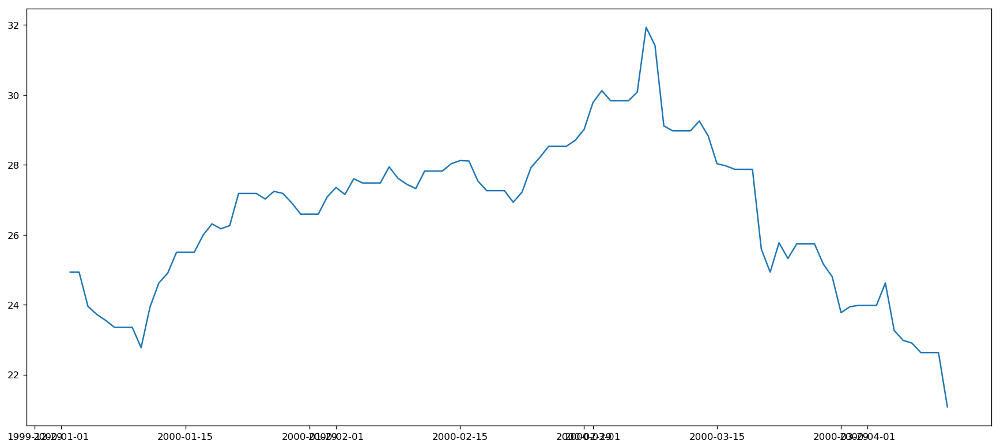

In [193]:
#Look if there is a stationary data, which looks non stationary
#We need stationary data to make time series forecasting
plt.plot(series[0:100])
plt.show()

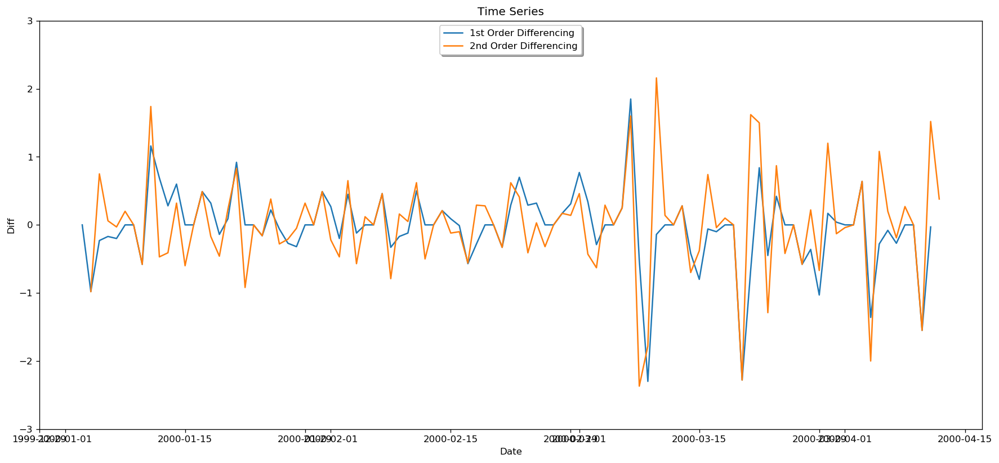

In [194]:
#find the order of differencing (d) in ARIMA model; hence the purpose of differencing it to make the time series stationary
daily_series_diff1 = series.diff(periods=1).dropna()
daily_series_diff2 = daily_series_diff1.diff(periods=1).dropna()
fig, ax = plt.subplots()
ax.plot(daily_series_diff1[0:100], label='1st Order Differencing')
ax.plot(daily_series_diff2[0:100], label='2nd Order Differencing')
plt.ylim([-3,3])
legend = ax.legend(loc='upper center', shadow=True)
plt.title('Time Series')
plt.xlabel('Date')
plt.ylabel('Diff')
plt.show()

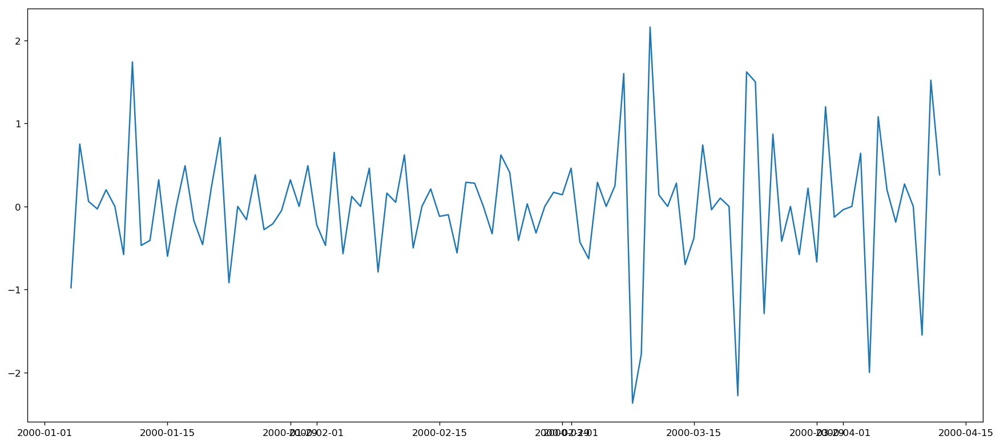

In [195]:
daily_series_diff2 = daily_series_diff1.diff(periods=1)#.fillna(0)
daily_series_diff2=daily_series_diff2[1:]
plt.plot(daily_series_diff2[0:100])
plt.show()


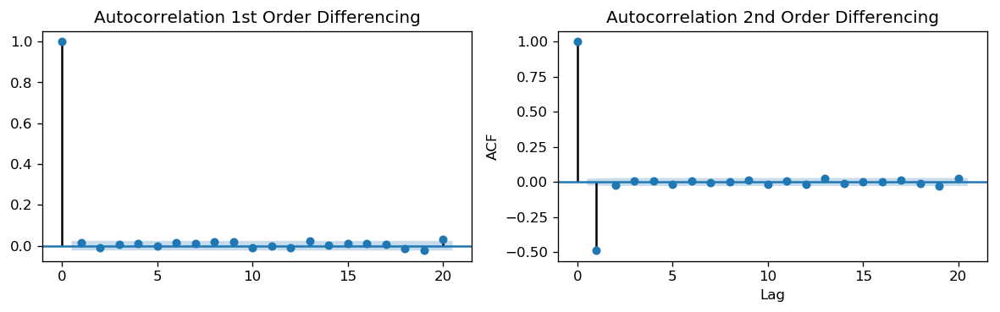

In [196]:
plt.rcParams.update({'figure.figsize':(12,3), 'figure.dpi':120})
from statsmodels.graphics.tsaplots import plot_acf
fig, axes = plt.subplots(1, 2, sharex=True)
plot_acf(daily_series_diff1, lags=20, ax=axes[0], title="Autocorrelation 1st Order Differencing")
plot_acf(daily_series_diff2, lags=20, ax=axes[1], title="Autocorrelation 2nd Order Differencing")
plt.xlabel('Lag')
plt.ylabel('ACF')
plt.show()

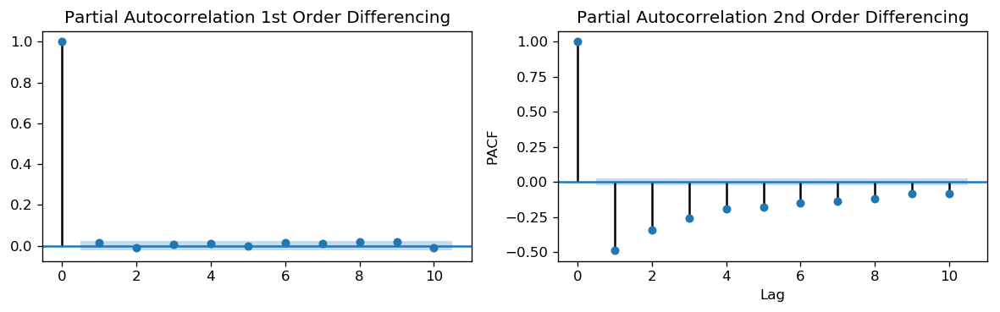

In [197]:
#Determine the number of the moving average by looking at the Partial Autocorrelation : p value should be one based on the Partial Autocorrelation 
plt.rcParams.update({'figure.figsize':(12,3), 'figure.dpi':120})
#Partial Auto-Correlation
from statsmodels.graphics.tsaplots import plot_pacf
fig, axes = plt.subplots(1, 2, sharex=True)
plot_pacf(daily_series_diff1, lags=10, ax=axes[0], title="Partial Autocorrelation 1st Order Differencing")
plot_pacf(daily_series_diff2, lags=10, ax=axes[1], title="Partial Autocorrelation 2nd Order Differencing")
plt.xlabel('Lag')
plt.ylabel('PACF')
plt.show()

In [198]:
#Number of differences required for a stationary series
from pmdarima.arima.utils import ndiffs
y=series
# augmented Dickey–Fuller test (adf test)
print("ADF Test: ",ndiffs(y, test='adf'))
# Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test
print("KPSS Test: ",ndiffs(y, test='kpss'))
# Phillips–Perron (PP) test:
print("PP Test: ",ndiffs(y, test='pp'))

ADF Test:  1
KPSS Test:  1
PP Test:  1


In [199]:
import pmdarima as pm
model = pm.auto_arima(series, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model.summary())

Fit ARIMA: order=(1, 1, 1); AIC=21011.287, BIC=21038.666, Fit time=1.512 seconds
Fit ARIMA: order=(0, 1, 0); AIC=21009.243, BIC=21022.932, Fit time=0.005 seconds
Fit ARIMA: order=(1, 1, 0); AIC=21009.873, BIC=21030.407, Fit time=0.064 seconds
Fit ARIMA: order=(0, 1, 1); AIC=21009.846, BIC=21030.380, Fit time=0.036 seconds
Total fit time: 1.656 seconds
                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 6938
Model:                 ARIMA(0, 1, 0)   Log Likelihood              -10502.621
Method:                           css   S.D. of innovations              1.099
Date:                Wed, 16 Oct 2019   AIC                          21009.243
Time:                        13:29:26   BIC                          21022.932
Sample:                             1   HQIC                         21013.962
                                                                              
              

In [200]:
import itertools
p = d = q = range(0,6)
pdq = list(itertools.product(p,d,q))

In [201]:
#AIC estimates the quality of each model
for param in pdq:
    try:
        ARIMA_model = ARIMA(series, order=param).fit(transparams=False)
        print(param,model.aic)
    except:
        continue
#(3, 1, 1) 21004.753834856074
#(5, 1, 3) 21003.220554809428

(0, 0, 0) <function ARIMA.aic at 0x000002240D669B70>
(0, 0, 1) <function ARIMA.aic at 0x000002241A36EBF8>
(0, 1, 0) <function ARIMA.aic at 0x000002240D669B70>
(0, 1, 1) <function ARIMA.aic at 0x000002240D669B70>
(0, 1, 2) <function ARIMA.aic at 0x000002240D669B70>
(0, 1, 3) <function ARIMA.aic at 0x000002240D669B70>
(0, 1, 4) <function ARIMA.aic at 0x000002240D669B70>
(0, 1, 5) <function ARIMA.aic at 0x000002240D669B70>
(0, 2, 0) <function ARIMA.aic at 0x000002241A36ED90>
(0, 2, 1) <function ARIMA.aic at 0x000002241A36EBF8>
(0, 2, 2) <function ARIMA.aic at 0x000002241A36ED90>
(1, 0, 0) <function ARIMA.aic at 0x000002241A36EBF8>
(1, 0, 1) <function ARIMA.aic at 0x000002241A36E9D8>
(1, 0, 2) <function ARIMA.aic at 0x000002241A36ED90>
(1, 0, 3) <function ARIMA.aic at 0x000002241A36ED90>
(1, 0, 4) <function ARIMA.aic at 0x000002240D669B70>
(1, 0, 5) <function ARIMA.aic at 0x000002240D669B70>
(1, 1, 0) <function ARIMA.aic at 0x000002240D669B70>
(1, 1, 1) <function ARIMA.aic at 0x000002240D6

In [203]:
from statsmodels.tsa.arima_model import ARIMA
# fit model
model = ARIMA(series, order=(1, 0, 1)).fit(transparams=False)
print(model.summary())

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 6939
Model:                     ARMA(1, 1)   Log Likelihood              -10505.876
Method:                       css-mle   S.D. of innovations                nan
Date:                Wed, 16 Oct 2019   AIC                          21019.753
Time:                        13:49:24   BIC                          21047.132
Sample:                    01-02-2000   HQIC                         21029.191
                         - 12-31-2018                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         69.4366     17.955      3.867      0.000      34.246     104.627
ar.L1.y        0.9992      0.000   2088.879      0.000       0.998       1.000
ma.L1.y        0.0147      0.012      1.208      0.2

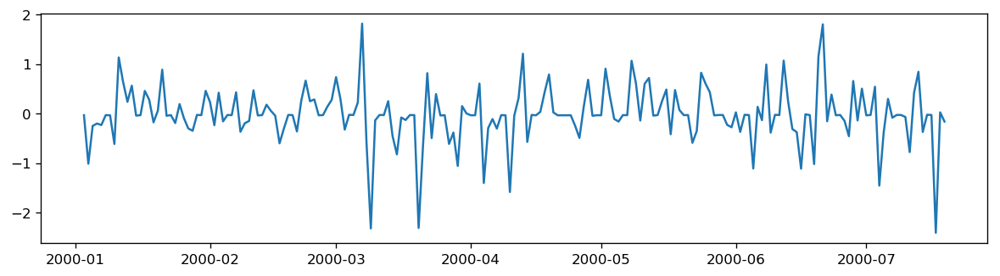

In [204]:
plt.plot(model.resid[1:200])
plt.show()

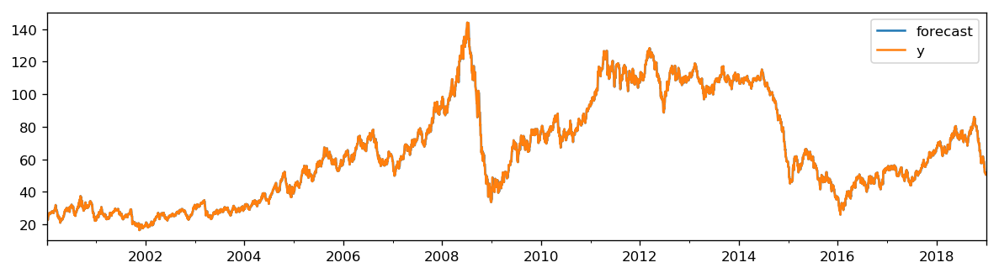

In [205]:
# Actual vs Fitted
pd.plotting.register_matplotlib_converters()
model.plot_predict(dynamic=False)
plt.show()

In [206]:
#Forecast the oil prices for the period start='1/1/2019', end='9/30/2019'
#typ='levels' if d is not set to zero (d = the number of nonseasonal differences)
ARIMA_Predict = model.predict(start='1/1/2019', end='9/30/2019')

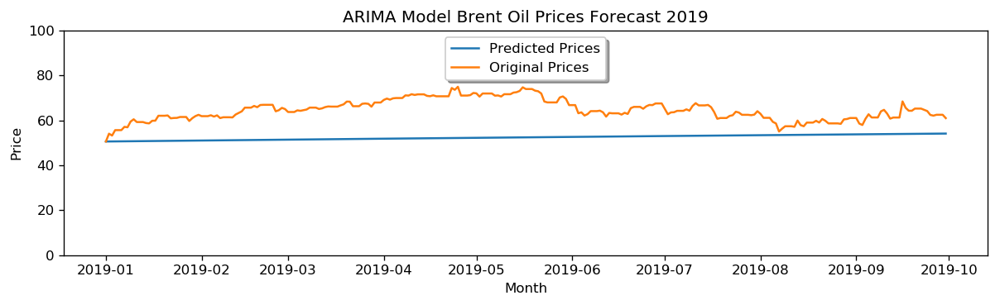

In [207]:
# Create plots with pre-defined labels.
fig, ax = plt.subplots()
ax.plot(forecast2019['ds'], ARIMA_Predict, label='Predicted Prices')
ax.plot(test['date'], test['price'], label='Original Prices')
plt.ylim([0,100])
legend = ax.legend(loc='upper center', shadow=True)
plt.title('ARIMA Model Brent Oil Prices Forecast 2019')
plt.xlabel('Month')
plt.ylabel('Price')
plt.show()

In [209]:
from sklearn.metrics import mean_absolute_error
maeARIMA=mean_absolute_error(test['price'],ARIMA_Predict)
maeProphet=mean_absolute_error(test['price'],forecast2019['yhat'])
print('Mean Absolute Error ARIMA = {}'.format(round(maeARIMA, 2)))
print('Mean Absolute Error Prophet = {}'.format(round(maeProphet, 2)))

Mean Absolute Error ARIMA = 12.23
Mean Absolute Error Prophet = 7.3


In [210]:
mseProphet = mean_squared_error(test['price'],forecast2019['yhat'])
mseARIMA = mean_squared_error(test['price'],ARIMA_Predict)
print('The Mean Squared Error of ARIMA forecasts is {}'.format(round(mseARIMA, 2)))
print('The Mean Squared Error of Prophet forecasts is {}'.format(round(mseProphet, 2)))

The Mean Squared Error of ARIMA forecasts is 172.38
The Mean Squared Error of Prophet forecasts is 73.03


In [211]:
rmseProphet = sqrt(mseProphet)
rmseARIMA = sqrt(mseARIMA)
print('The Root Mean Squared Error of ARIMA forecasts is {}'.format(round(rmseARIMA, 2)))
print('The Root Mean Squared Error of Prophet forecasts is {}'.format(round(rmseProphet, 2)))

The Root Mean Squared Error of ARIMA forecasts is 13.13
The Root Mean Squared Error of Prophet forecasts is 8.55
